# **Healthcare Data Analysis**

**Introduction:**

The purpose of this project is to analyse patient data from a healthcare dataset to extract meaningful insights using big data techniques and Databricks tools. The analysis focuses on understanding various patterns in patient demographics, medical conditions, hospital admissions and billing amounts to help healthcare organisations make informed decisions. We aim to use the data to identify trends in patient admissions, the frequency of medical conditions and the cost distribution associated with different treatments and hospitals.





**Data Loading and Schema Inspection:**

The Kaggle healthcare dataset is loaded from DBFS into a PySpark DataFrame. The schema is inspected to understand the structure and data types, ensuring the data is ready for further analysis.

**Data Transformation:**

Columns like "Name" are transformed to standardize the formatting (e.g., capitalizing the first letter).


In [0]:
df = spark.read.csv("/FileStore/tables/healthcare_dataset.csv", header=True, inferSchema=True)
display(df)

Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281305978155,328,Urgent,2024-02-02,Paracetamol,Normal
LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327286577885,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096078842456,205,Emergency,2022-10-07,Aspirin,Normal
andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78240987528,450,Elective,2020-12-18,Ibuprofen,Abnormal
adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317813937623,458,Urgent,2022-10-09,Penicillin,Abnormal
EMILY JOHNSOn,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.11095104189,389,Urgent,2023-12-24,Ibuprofen,Normal
edwArD EDWaRDs,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.87234486093,389,Emergency,2020-11-15,Paracetamol,Inconclusive
CHrisTInA MARtinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.46272159459,277,Emergency,2022-01-07,Paracetamol,Inconclusive
JASmINe aGuIlaR,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.222791548505,316,Elective,2020-07-14,Aspirin,Abnormal
ChRISTopher BerG,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.63106221073,249,Elective,2021-06-22,Paracetamol,Inconclusive


In [0]:
# Checking the schema of the DataFrame
df.printSchema()

root
 |-- Name: string (nullable = true)
 |-- Age: integer (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Blood Type: string (nullable = true)
 |-- Medical Condition: string (nullable = true)
 |-- Date of Admission: date (nullable = true)
 |-- Doctor: string (nullable = true)
 |-- Hospital: string (nullable = true)
 |-- Insurance Provider: string (nullable = true)
 |-- Billing Amount: double (nullable = true)
 |-- Room Number: integer (nullable = true)
 |-- Admission Type: string (nullable = true)
 |-- Discharge Date: date (nullable = true)
 |-- Medication: string (nullable = true)
 |-- Test Results: string (nullable = true)



In [0]:
#Capitalising first letter of Name
from pyspark.sql.functions import initcap

df = df.withColumn("Name", initcap("Name"))
display(df)

Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
Bobby Jackson,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281305978155,328,Urgent,2024-02-02,Paracetamol,Normal
Leslie Terry,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327286577885,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
Danny Smith,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096078842456,205,Emergency,2022-10-07,Aspirin,Normal
Andrew Watts,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78240987528,450,Elective,2020-12-18,Ibuprofen,Abnormal
Adrienne Bell,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317813937623,458,Urgent,2022-10-09,Penicillin,Abnormal
Emily Johnson,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.11095104189,389,Urgent,2023-12-24,Ibuprofen,Normal
Edward Edwards,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.87234486093,389,Emergency,2020-11-15,Paracetamol,Inconclusive
Christina Martinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.46272159459,277,Emergency,2022-01-07,Paracetamol,Inconclusive
Jasmine Aguilar,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.222791548505,316,Elective,2020-07-14,Aspirin,Abnormal
Christopher Berg,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.63106221073,249,Elective,2021-06-22,Paracetamol,Inconclusive


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

**Analysis:**

**Average Billing Amount by Medical Condition:**

The lowest average billing is for Diabetes at 25,198, while the highest is for Asthma at 26,086. This suggests that billing costs vary slightly by medical condition, with asthma treatments or procedures generally costing more on average than those for diabetes.

**Billing Distribution by Insurance Provider:**

The box plot shows a nearly normal distribution for billing amounts across all insurance providers, with the median values ranging from 25,000 to over 26,000. This indicates a consistent range of billing costs regardless of the insurance provider.

**Billing Distribution by Month:**

The trend in billing distribution shows a decline from May 2019 (highest at 3,036,708) to May 2024 (lowest at 912,944). The highest billing is observed in August 2020 at 5,338,718. This suggests significant variability in monthly billing amounts over time, possibly due to external factors such as healthcare demand, policy changes or seasonal variations.

**Descriptive Analysis:**

Histograms are generated to analyze the distribution of patient ages and billing amounts.
The frequency of medical conditions is analyzed based on admission type and blood type.


Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


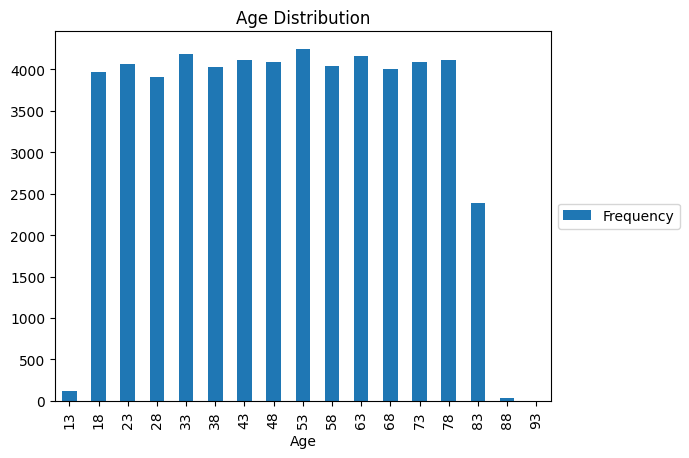

In [0]:
%pip install matplotlib pandas numpy

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


# Adjusting bins to have a wider range for Age Distribution
age_histogram = df.select("Age").rdd.flatMap(lambda x: [x]).histogram(list(np.arange(start=min(df.select("Age").rdd.flatMap(lambda x: [x]).min()), 
                                                                             stop=max(df.select("Age").rdd.flatMap(lambda x: [x]).max()) + 10, 
                                                                             step=5)))
age_pd = pd.DataFrame(list(zip(*age_histogram)), columns=['Age', 'Frequency'])

# Plotting with frequency legend outside graph area
fig, ax = plt.subplots()
age_pd.plot(kind='bar', x='Age', y='Frequency', title="Age Distribution", ax=ax)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.close(fig)  # Prevents the automatic display of the figure in Jupyter-like environments
display(fig)

**Analysis:**

- Most patients are within the age range of 18 to 78, showing a relatively uniform distribution in this age group.

- The frequency drops significantly for ages below 18 and above 78, indicating fewer admissions in these age groups.


Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


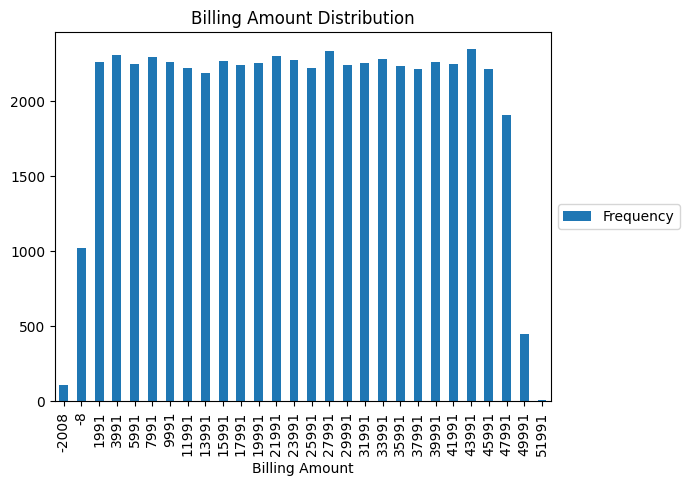

In [0]:
%pip install matplotlib pandas

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Adjusting bins for Billing Amount Distribution in whole numbers and increasing bin range in thousands
billing_amount_min = df.select("Billing Amount").rdd.flatMap(lambda x: x).min()
billing_amount_max = df.select("Billing Amount").rdd.flatMap(lambda x: x).max()
bin_range = np.arange(start=billing_amount_min, stop=billing_amount_max + 2000, step=2000).tolist()  # Adjust step for bin size

billing_histogram = df.select("Billing Amount").rdd.flatMap(lambda x: [x[0]]).histogram(bin_range)
billing_pd = pd.DataFrame(list(zip(*billing_histogram)), columns=['Billing Amount', 'Frequency'])

# Remove decimals from Billing Amount
billing_pd['Billing Amount'] = billing_pd['Billing Amount'].astype(int)

# Plotting with frequency legend outside graph area
fig, ax = plt.subplots()
billing_pd.plot(kind='bar', x='Billing Amount', y='Frequency', title="Billing Amount Distribution", ax=ax)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.close(fig)  # Prevents the automatic display of the figure in Jupyter-like environments
display(fig)

**Analysis:**

- Billing amounts between 1991 and 47,991 have relatively uniform frequencies, indicating a consistent range of treatment costs, with billing amounts up to 45991 have a consistently high frequency, i.e., above 2000


- Extremely low (< 1991) or high billing amounts (> 47991) show significantly lower frequencies, suggesting these are less common. Negative billing amounts are retained in the dataset as they may represent refunds, adjustments or corrections in the billing records. 

In [0]:
#Creating a graph of Medical Condition by Admission Type 
from pyspark.sql.functions import count

# Grouping data by Medical Condition and Admission Type, then counting occurrences
histogram_data = df.groupBy("Medical Condition", "Admission Type").agg(count("*").alias("Frequency"))

display(histogram_data)

Medical Condition,Admission Type,Frequency
Cancer,Emergency,3015
Hypertension,Emergency,3001
Cancer,Urgent,3064
Diabetes,Emergency,3017
Arthritis,Emergency,3108
Hypertension,Urgent,3023
Obesity,Elective,3043
Obesity,Urgent,3062
Diabetes,Urgent,3229
Arthritis,Elective,3083


Databricks visualization. Run in Databricks to view.

**Analysis:**

The nearly uniform distribution of chronic conditions across elective, urgent, and emergency care suggests these issues are consistently critical regardless of care type, necessitating comprehensive and ongoing management.

- Hypertension is more prevalent in elective care, suggesting patients regularly manage this condition through planned medical visits.
- Diabetes is notable in urgent care, pointing to acute complications requiring prompt attention.
- Obesity is higher in emergency care, reflecting its potential to lead to severe, immediate health crises.

In [0]:
#Creating a graph of Medical Condition by Blood Type
from pyspark.sql.functions import count

# Grouping by Blood Type and Medical Condition
blood_type_condition_histogram = df.groupBy("Blood Type", "Medical Condition").agg(count("*").alias("Frequency"))

display(blood_type_condition_histogram)

Blood Type,Medical Condition,Frequency
O+,Diabetes,1151
AB-,Diabetes,1139
A+,Asthma,1135
O-,Asthma,1154
B-,Arthritis,1169
A-,Asthma,1173
O+,Arthritis,1198
O+,Asthma,1173
B-,Hypertension,1173
AB-,Hypertension,1125


Databricks visualization. Run in Databricks to view.

**Analysis:**

- Diabetes is most frequent in A+ (1213), suggesting this blood type might have a higher prevalence for this condition.
- Asthma has the highest frequency in AB+ (1189), indicating a greater impact on this blood type.
- Arthritis is most common in B+ (1201), showing a significant occurrence in this group.
- Hypertension is highest in AB+ (1215), highlighting a particular vulnerability for this blood type.
- Obesity is more frequent in B- (1188), suggesting a notable correlation.
- Cancer shows a high occurrence in AB- (1198), indicating a significant presence within this blood type.



**Exploratory SQL Queries:**

SQL queries are used to identify patterns, such as the most common medical conditions by hospital and the medical conditions associated with the highest average billing amounts.

**Visualization and Advanced Analysis:**

Visualizations are created to graphically represent the distribution of billing amounts and the frequency of medical conditions across different hospitals.

Complex SQL queries are executed to determine the costliest medical conditions by hospital and to understand the impact of age on billing amounts.



In [0]:
#Finding frequency of admissions of all hospitals
hospital_histogram = df.groupBy("Hospital").agg(count("*").alias("Frequency"))

display(hospital_histogram)

Hospital,Frequency
Ramirez-Robinson,3
"Foster Lamb, Graham and",1
LLC Massey,2
Coleman-Aguilar,1
Group Stein,2
Smith PLC,36
Alvarado-Martin,1
Hall Group,8
"and Mayo Chen, Murray",1
Lopez-Wilson,2


In [0]:
#Filtering Top 10 Hospital based on number of admissions
hospital_histogram.createOrReplaceTempView("hospital_histogram")
display(spark.sql("select * from hospital_histogram order by Frequency desc limit 10"))

Hospital,Frequency
LLC Smith,44
Ltd Smith,39
Johnson PLC,38
Smith Ltd,37
Smith PLC,36
Smith Group,36
Johnson Inc,35
Smith Inc,34
Smith LLC,32
Group Smith,32


Databricks visualization. Run in Databricks to view.

**Analysis:**

- LLC Smith dominates the top 10 hospitals by admissions, reflecting a significant market presence.

- Admissions are relatively balanced across the top 10, with a narrow range between 32 and 44.

In [0]:
#Creating a temporary view for running SQL queries
df.createOrReplaceTempView("medical_data")

In [0]:
#Using Spark SQL to find the top 10 hospitals with the highest average billing by medical coniditon
display(spark.sql("SELECT `Medical Condition`, Hospital, AVG(`Billing Amount`) AS Avg_Billing FROM medical_data GROUP BY `Medical Condition`, Hospital ORDER BY Avg_Billing DESC LIMIT 5"))

Medical Condition,Hospital,Avg_Billing
Hypertension,Griffin Group,52764.276736469175
Cancer,Hernandez-Morton,52373.032374241826
Hypertension,Sons and Bailey,52271.66374715383
Asthma,PLC Garner,52181.837792399056
Arthritis,Walker-Garcia,52170.03685355641


Databricks visualization. Run in Databricks to view.

**Analysis:**


- Griffin Group has the highest average billing for Hypertension at 52,764.28.
- Hernandez-Morton ranks second with Cancer treatments averaging 52,373.03.
- Sons and Bailey comes in third with Hypertension treatments averaging 52,271.66.
- PLC Garner is fourth, with an average billing for Asthma at 52,181.84.
- Walker-Garcia is fifth, having an average billing for Arthritis at 52,170.04.

These findings highlight that Hypertension and Cancer are among the most expensive conditions to treat across different hospitals.

In [0]:
%sql
SELECT * from
(select Age, `Medical Condition`, AVG(`Billing Amount`) as Avg_Billing
FROM medical_data
GROUP BY Age, `Medical Condition`
) subquery
ORDER BY Avg_Billing DESC;

Age,Medical Condition,Avg_Billing
15,Hypertension,44389.81486728755
14,Asthma,44079.145823366656
14,Diabetes,40229.178074961295
15,Arthritis,38629.04201094812
13,Asthma,35138.80307694793
86,Cancer,34062.613280211604
16,Arthritis,33914.417089014
88,Hypertension,33273.89917294848
16,Asthma,33232.75259284739
13,Cancer,33125.69811380318


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

**Analysis:**

**1. Average, Minimum, and Maximum Billing Amount by Age:**

- Age 15 shows the highest maximum billing amount of 44,389.8, the highest minimum billing of 24,743.6, and the highest average billing of 32,660.
- Average billing generally decreases and stabilizes within the range of 24,000 to 26,000 across most ages.
- At age 86, there is a slight increase in the average billing amount to 29,073.1.
- The lowest average billing amount is observed at age 89, at 14,892.

**2. Age-Billing Correlation by Medical Condition:**

There is no apparent correlation between age and billing amount across different medical conditions, indicating that billing is not strongly influenced by age for specific conditions.

**Conclusion:**

The analysis reveals key insights into the healthcare dataset, including billing trends, the prevalence of medical conditions and how these factors vary across different hospitals. The visualizations and SQL queries provide a clear understanding of the data, enabling data-driven decision-making for healthcare management and policy formulation.
